## SETUP

In [70]:
import os
import pandas as pd
import seaborn as sns
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import confusion_matrix
import time

Missing values in Diagnosis at the Patient Level
0=Unknown
1=benign or non-malignant disease
2= malignant, primary lung cancer
3 = malignant metastatic
: 847
Missing values in Diagnosis Method
0 = unknown
1 = review of radiological images to show 2 years of stable nodule
2 = biopsy
3 = surgical resection
4 = progression or response: 847
Missing values in Primary tumor site for metastatic disease: 847
Missing values in Diagnosis Nodule 1: 865
Missing values in Diagnosis Method Nodule 1: 865
Missing values in Diagnosis Nodule 2: 954
Missing values in Diagnosis Method Nodule 2: 954
Missing values in Diagnosis Nodule 3: 966
Missing values in Diagnosis Method Nodule 3: 966
Missing values in Diagnosis Nodule 4: 966
Missing values in Diagnosis Method Nodule 4: 966
Missing values in Diagnosis Nodule 5: 966
Missing values in Diagnosis Method Nodule 5: 966
Missing values in Diagnosis at the Patient Level
0=Unknown
1=benign or non-malignant disease
2= malignant, primary lung cancer
3 = malignant 

C:\Users\regda\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Selected Features: Index(['Nodule_id', 'Patient_id', 'Subtlety', 'Calcification', 'Sphericity',
       'Margin', 'Spiculation', 'original_shape_Elongation',
       'original_shape_Flatness', 'original_shape_LeastAxisLength',
       'original_shape_MajorAxisLength',
       'original_shape_Maximum2DDiameterColumn',
       'original_shape_Maximum2DDiameterRow',
       'original_shape_Maximum2DDiameterSlice',
       'original_shape_MinorAxisLength', 'original_shape_Sphericity',
       'original_shape_SurfaceArea', 'original_shape_SurfaceVolumeRatio',
       'original_firstorder_Energy', 'original_glrlm_GrayLevelNonUniformity',
       'original_glrlm_LongRunEmphasis',
       'original_glrlm_LongRunHighGrayLevelEmphasis',
       'original_glrlm_LongRunLowGrayLevelEmphasis',
       'original_glrlm_RunEntropy', 'original_glrlm_RunLengthNonUniformity',
       'original_glrlm_RunLengthNonUniformityNormalized',
       'original_glrlm_RunVariance',
       'original_glrlm_ShortRunLowGrayLevelEmphas

C:\Users\regda\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Selected Features: Index(['Subtlety', 'Calcification', 'original_shape_Elongation',
       'original_shape_MinorAxisLength', 'original_shape_SurfaceArea',
       'original_shape_SurfaceVolumeRatio',
       'original_glrlm_LongRunHighGrayLevelEmphasis',
       'original_gldm_DependenceNonUniformity',
       'original_gldm_DependenceVariance',
       'original_gldm_SmallDependenceHighGrayLevelEmphasis',
       'original_gldm_SmallDependenceLowGrayLevelEmphasis',
       'Primary tumor site for metastatic disease'],
      dtype='object')


C:\Users\regda\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:676: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Selected Features: Index(['Nodule_id', 'Subtlety', 'Calcification', 'Margin',
       'original_shape_Elongation', 'original_shape_Maximum2DDiameterColumn',
       'original_shape_MinorAxisLength', 'original_shape_SurfaceArea',
       'original_shape_SurfaceVolumeRatio', 'original_firstorder_Energy',
       'original_glrlm_LongRunHighGrayLevelEmphasis',
       'original_glrlm_LongRunLowGrayLevelEmphasis',
       'original_glrlm_RunEntropy', 'original_gldm_DependenceNonUniformity',
       'original_gldm_DependenceVariance',
       'original_gldm_LargeDependenceEmphasis',
       'original_gldm_SmallDependenceEmphasis',
       'original_gldm_SmallDependenceHighGrayLevelEmphasis',
       'original_gldm_SmallDependenceLowGrayLevelEmphasis',
       'Primary tumor site for metastatic disease'],
      dtype='object')
Threshold 0.01:
Low 2D SD:
Index(['Nodule_id', 'Patient_id', 'Subtlety', 'Calcification', 'Margin',
       'Lobulation', 'Spiculation', 'original_shape_Elongation',
       'origina

C:\Users\regda\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.576e+01, tolerance: 7.444e-03
  model = cd_fast.enet_coordinate_descent(
C:\Users\regda\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.576e+01, tolerance: 7.444e-03
  model = cd_fast.enet_coordinate_descent(
C:\Users\regda\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.576e+01, toleranc

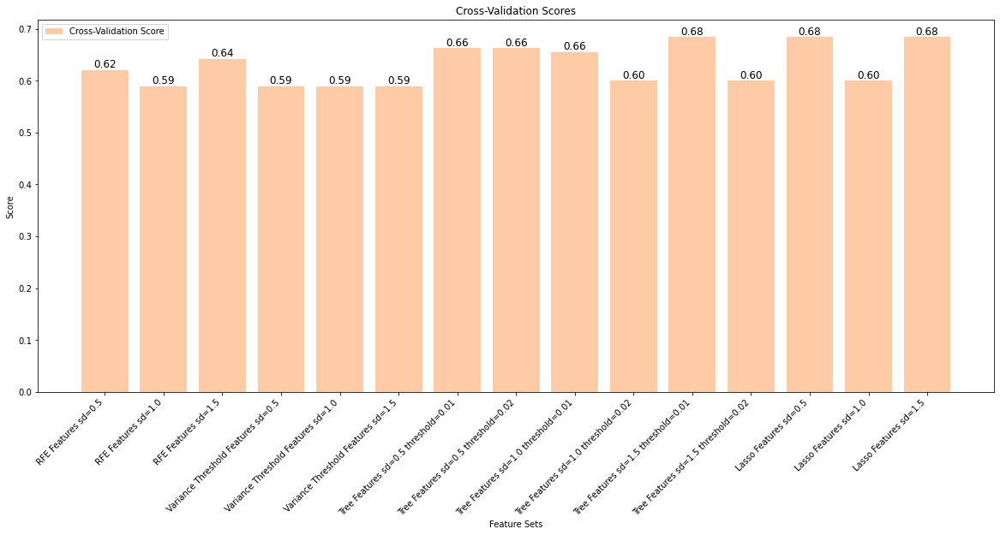

In [71]:
%run feature_selection.ipynb # Run the feature selection notebook to use some of the variables there

## Crucial Functions

In [72]:
# Function that helps us to find the best k for accuracy between 1 and kmax
def find_k_knn(X, y, kmax):
    k_values = [i for i in range (1,kmax+1)]
    accuracies = []
    for k in k_values:
        model = KNeighborsClassifier(k)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)
    print(accuracies)

    #Ploting the results of Cross Validation
    sns.lineplot(x = k_values, y = accuracies, marker = 'o')
    plt.xlabel("K Values")
    plt.ylabel("Accuracy Score")
    plt.title('Knn performance')
    plt.grid(True)  # Add grid for better readability 

    best_index = np.argmax(accuracies)
    best_k = k_values[best_index]
    print(f'Best k = {best_k}')

In [73]:
# Function that helps us to find the best number of estimators for accuracy between 1 and numestimatorsmax
def find_est_rf(X, y, numestimatorsmax, random_state):
    numest = [i for i in range(1, numestimatorsmax+1, 10)]
    accuracies = []
    for est in numest:
        model = RandomForestClassifier(est)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)
    print(accuracies)
    
    sns.lineplot(x = numest, y = accuracies, marker = 'o')
    plt.xlabel("Nr of estimators")
    plt.ylabel("Accuracy Score")
    plt.title('RandomForest performance')
    plt.grid(True)  # Add grid for better readability 
    
    best_index = np.argmax(accuracies)
    best_est = numest[best_index]
    print(f'Best estimator = {best_est}')

In [74]:
# Function that builds the confusion matrix for a specific k value
def build_cm_knn(X, y, k):
    model = KNeighborsClassifier(k)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:\n", cm)

    plt.figure()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.colorbar()
    plt.ylabel('Real')
    plt.xlabel('Predict')
    plt.show()

In [75]:
# Function that builds the heatmap based on the confusion matrix for a specific k value
def build_heatmap_knn(X, y, k):
    model = KNeighborsClassifier(k)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Reds")
    plt.xlabel('Predict')
    plt.ylabel('Real')
    plt.xticks([0, 1, 2, 3], ['Highly unlikely', 'Moderately unlikely', 'Indeterminate', 'Moderately Suspicious'])
    plt.yticks([0, 1, 2, 3], ['Highly unlikely', 'Moderately unlikely', 'Indeterminate', 'Moderately Suspicious'])
    plt.title('Confusion Matrix w/ values')
    plt.show()

In [76]:
# Function that prints the precision, recall and f1-score based on the confusion matrix for a specific k value
def show_stats_knn(k):
    model = KNeighborsClassifier(k)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    precision = precision_score(y_test, y_pred, average=None)
    recall = recall_score(y_test, y_pred, average=None)
    f1 = f1_score(y_test, y_pred, average=None)

    data = {'Feature Set': ['Highly unlikely', 'Moderately unlikely', 'Indeterminate', 'Moderately Suspicious'],
            'Precision': precision,
            'Recall': recall,
            'F1-score': f1 }

    df = pd.DataFrame(data)
    print(df)

In [77]:
# Function that shows the training time of the dataset for a specific k value
def time_stats_knn(k):
    start_time = time.time()
    model = KNeighborsClassifier(k)
    model.fit(X_train, y_train)
    end_time = time.time()
    training_time = end_time - start_time
    print("Tempo de Treinamento", training_time, "segundos")

In [78]:
# Function that builds the confusion matrix for a specific est value
def build_cm_rf(X, y, est):
    model = RandomForestClassifier(est)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:\n", cm)

    plt.figure()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.colorbar()
    plt.ylabel('Real')
    plt.xlabel('Predict')
    plt.show()

In [79]:
# Function that builds the heatmap based on the confusion matrix for a specific est value
def build_heatmap_rf(X, y, est):
    model = RandomForestClassifier(est)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Reds")
    plt.xlabel('Predict')
    plt.ylabel('Real')
    plt.xticks([0, 1, 2, 3], ['Highly unlikely', 'Moderately unlikely', 'Indeterminate', 'Moderately Suspicious'])
    plt.yticks([0, 1, 2, 3], ['Highly unlikely', 'Moderately unlikely', 'Indeterminate', 'Moderately Suspicious'])
    plt.title('Confusion Matrix w/ values')
    plt.show()

In [80]:
# Function that prints the precision, recall and f1-score based on the confusion matrix for a specific est value
def show_stats_rf(est):
    model = RandomForestClassifier(est)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    precision = precision_score(y_test, y_pred, average=None)
    recall = recall_score(y_test, y_pred, average=None)
    f1 = f1_score(y_test, y_pred, average=None)

    data = {'Feature Set': ['Highly unlikely', 'Moderately unlikely', 'Indeterminate', 'Moderately Suspicious'],
            'Precision': precision,
            'Recall': recall,
            'F1-score': f1 }

    df = pd.DataFrame(data)
    print(df)

In [81]:
# Function that shows the training time of the dataset for a specific est value
def time_stats_rf(est):
    start_time = time.time()
    model = RandomForestClassifier(est)
    model.fit(X_train, y_train)
    end_time = time.time()
    training_time = end_time - start_time
    print("Tempo de Treinamento", training_time, "segundos")

In [82]:
# Function that builds the pairplot of the data
def build_pairplot(data, X):
    sns.pairplot(data, hue='Malignancy', vars=X)
    plt.title('Pairplot das Características por Classe')
    plt.show()

# Training Models

After seeing the cross-validation scores of each features set, we chose the next 3 to train:
- with sd = 0.5: RFE features
- with sd = 1.0: Tree features with threshold = 0.01
- with sd = 1.5: Lasso features

We wanted to choose 3 groups of features that had a good accuracy and different kind of selection

For each group of features, we are going to train the dataset with KNN and RandomForest and collect some statistics, such as:
- features pairplots;
- accuracy graphics;
- confusion matrices;
- heatmap based on the confusion matrices;
- precision, recall and f1-score values;
- Train time.

## RFE features with sd = 0.5

In [83]:
X = low_2d_sd[low_rfe]
y = low_2d_sd['Malignancy']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

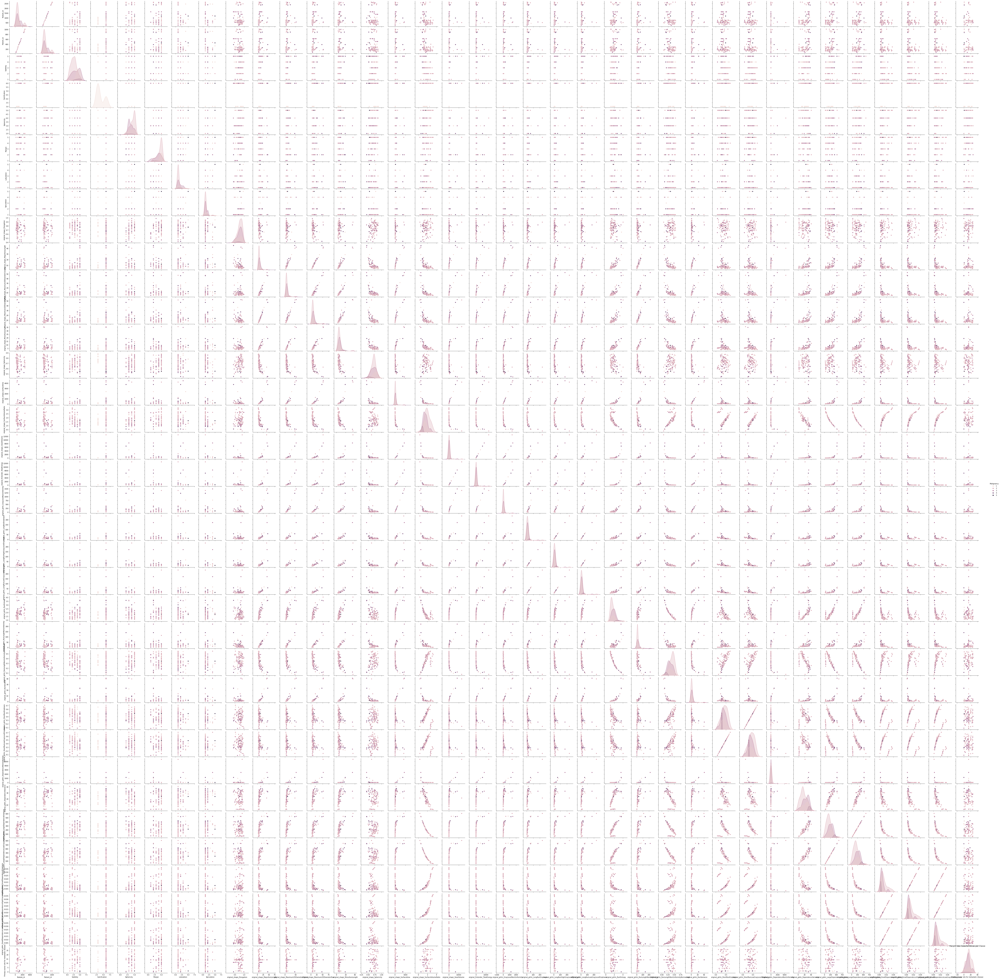

In [73]:
build_pairplot(low_2d_sd, X)

### With KNN

[0.2777777777777778, 0.25, 0.2777777777777778, 0.3611111111111111, 0.3055555555555556, 0.3333333333333333, 0.3333333333333333, 0.3888888888888889, 0.3888888888888889, 0.4166666666666667, 0.3611111111111111, 0.3611111111111111, 0.3888888888888889, 0.4166666666666667, 0.4166666666666667, 0.4444444444444444, 0.4444444444444444, 0.4444444444444444, 0.3888888888888889, 0.4722222222222222]
Best k = 20


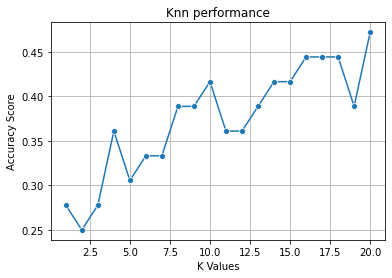

In [84]:
find_k_knn(X, y, 20)

Tempo de Treinamento 0.008562088012695312 segundos
             Feature Set  Precision    Recall  F1-score
0        Highly unlikely   0.000000  0.000000  0.000000
1    Moderately unlikely   0.769231  0.500000  0.606061
2          Indeterminate   0.318182  0.777778  0.451613
3  Moderately Suspicious   0.000000  0.000000  0.000000
Confusion Matrix:
 [[ 0  1  4  0]
 [ 1 10  9  0]
 [ 0  2  7  0]
 [ 0  0  2  0]]


C:\Users\regda\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


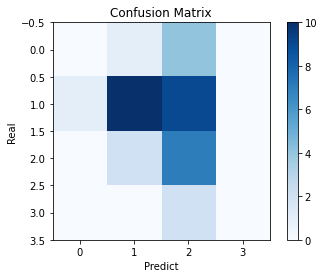

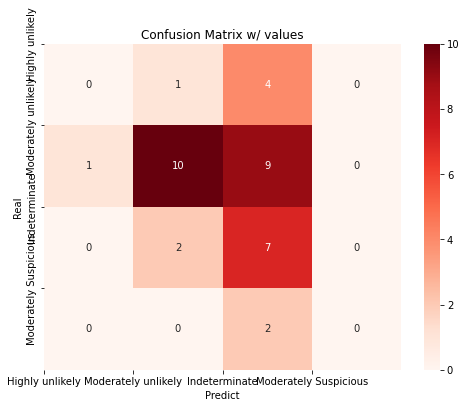

In [85]:
k = 20
time_stats_knn(k)
show_stats_knn(k)
build_cm_knn(X, y, k)
build_heatmap_knn(X, y, k)

### With RandomForest

[0.4722222222222222, 0.5833333333333334, 0.4722222222222222, 0.6388888888888888, 0.5833333333333334, 0.6666666666666666, 0.6111111111111112, 0.5833333333333334, 0.6388888888888888, 0.5555555555555556, 0.6388888888888888, 0.5833333333333334, 0.5833333333333334, 0.6111111111111112, 0.5833333333333334, 0.6111111111111112, 0.5833333333333334, 0.6388888888888888, 0.6388888888888888, 0.5277777777777778]
Best estimator = 51


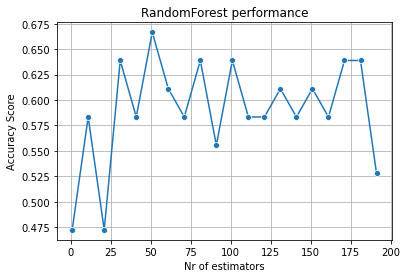

In [19]:
find_est_rf(X, y, 200, 42)

Tempo de Treinamento 0.003976106643676758 segundos
             Feature Set  Precision  Recall  F1-score
0        Highly unlikely   0.000000     0.0  0.000000
1    Moderately unlikely   0.555556     1.0  0.714286
2          Indeterminate   0.000000     0.0  0.000000
3  Moderately Suspicious   0.000000     0.0  0.000000
Confusion Matrix:
 [[ 0  5  0  0]
 [ 0 20  0  0]
 [ 0  9  0  0]
 [ 0  2  0  0]]


C:\Users\regda\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


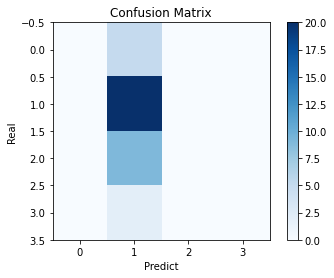

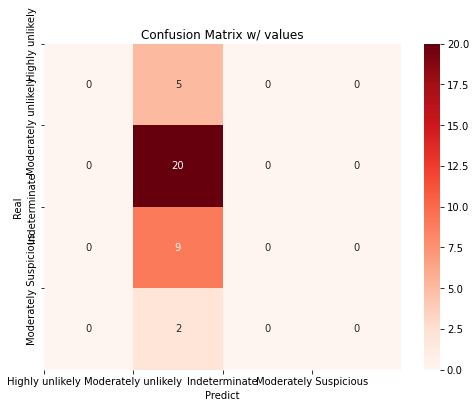

In [54]:
est = 81
time_stats_knn(est)
show_stats_knn(est)
build_cm_knn(X, y, est)
build_heatmap_knn(X, y, est)

## Tree features with sd = 1.0 and threshold = 0.01

In [55]:
X = medium_2d_sd[medium_tree_02]
y = medium_2d_sd['Malignancy']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

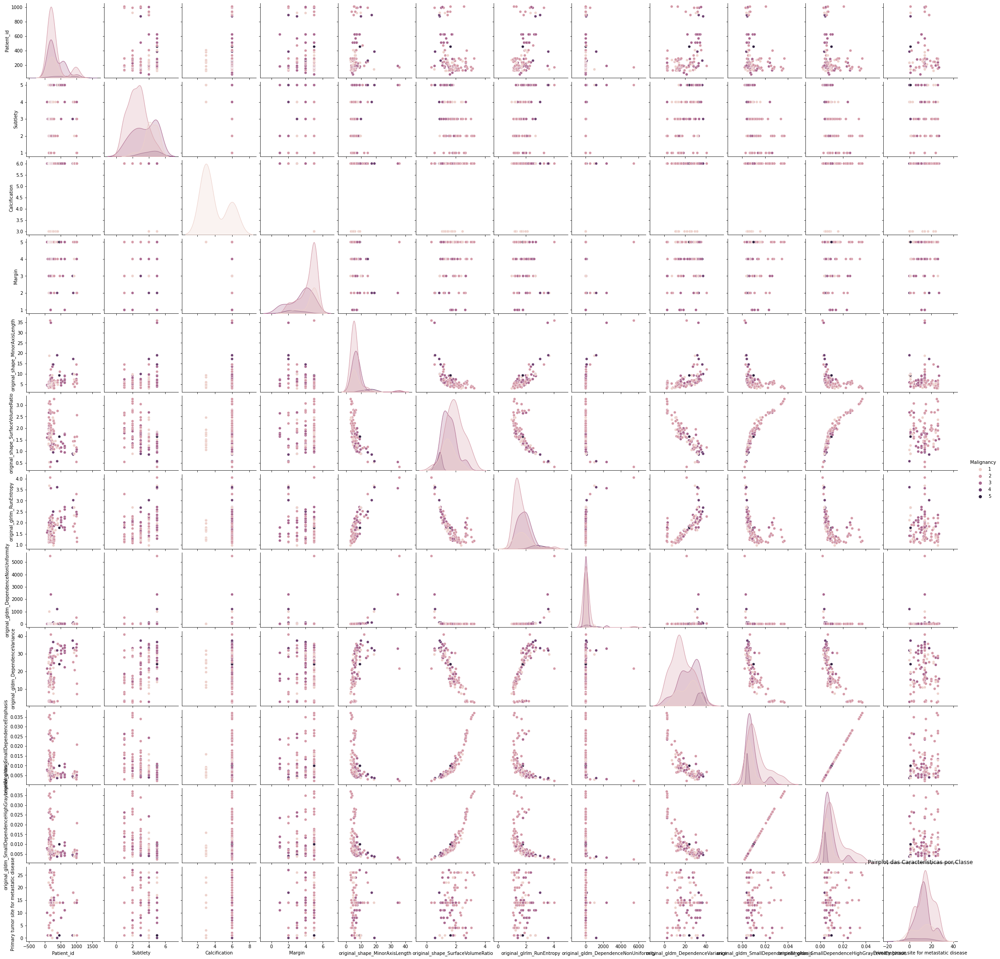

In [75]:
build_pairplot(medium_2d_sd, X)

### With KNN

[0.6111111111111112, 0.5, 0.5555555555555556, 0.6666666666666666, 0.5833333333333334, 0.4722222222222222, 0.5833333333333334, 0.5833333333333334, 0.6111111111111112, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.4722222222222222, 0.4722222222222222, 0.5277777777777778, 0.5555555555555556, 0.5555555555555556]
Best k = 4


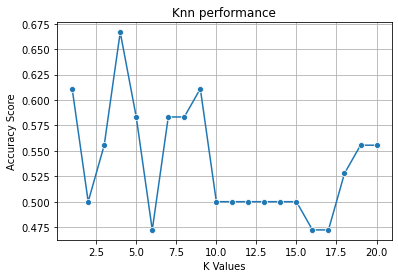

In [56]:
find_k_knn(X, y, 20)

Tempo de Treinamento 0.006556987762451172 segundos
             Feature Set  Precision    Recall  F1-score
0        Highly unlikely   0.571429  0.800000  0.666667
1    Moderately unlikely   0.789474  0.750000  0.769231
2          Indeterminate   0.500000  0.555556  0.526316
3  Moderately Suspicious   0.000000  0.000000  0.000000
Confusion Matrix:
 [[ 4  0  1  0]
 [ 2 15  3  0]
 [ 1  3  5  0]
 [ 0  1  1  0]]


C:\Users\regda\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


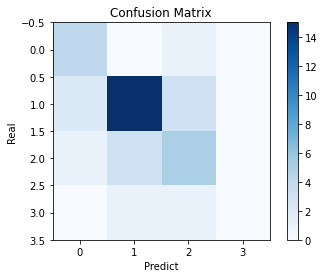

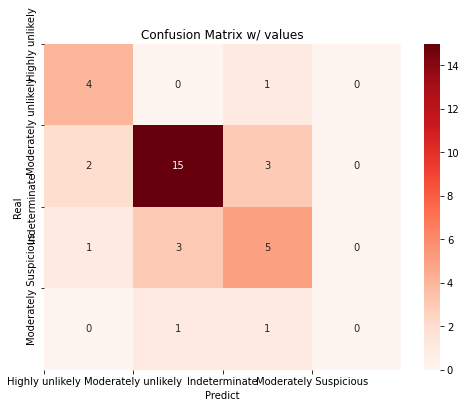

In [57]:
k = 4
time_stats_knn(k)
show_stats_knn(k)
build_cm_knn(X, y, k)
build_heatmap_knn(X, y, k)

### With RandomForest

[0.5555555555555556, 0.5833333333333334, 0.5833333333333334, 0.6666666666666666, 0.6388888888888888, 0.7222222222222222, 0.6944444444444444, 0.6944444444444444, 0.7222222222222222, 0.7222222222222222, 0.6666666666666666, 0.6111111111111112, 0.6666666666666666, 0.6944444444444444, 0.6666666666666666, 0.6666666666666666, 0.6944444444444444, 0.7222222222222222, 0.6666666666666666, 0.6944444444444444]
Best estimator = 51


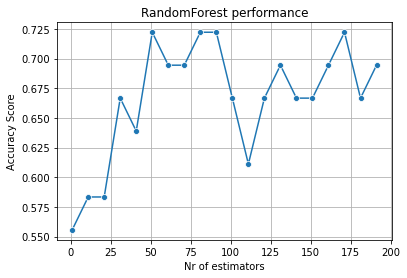

In [24]:
find_est_rf(X, y, 200, 42)

Tempo de Treinamento 0.0065958499908447266 segundos
             Feature Set  Precision    Recall  F1-score
0        Highly unlikely   0.000000  0.000000  0.000000
1    Moderately unlikely   0.640000  0.800000  0.711111
2          Indeterminate   0.454545  0.555556  0.500000
3  Moderately Suspicious   0.000000  0.000000  0.000000
Confusion Matrix:
 [[ 0  4  1  0]
 [ 0 16  4  0]
 [ 0  4  5  0]
 [ 0  1  1  0]]


C:\Users\regda\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


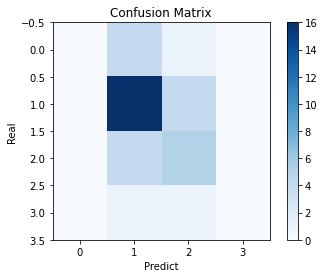

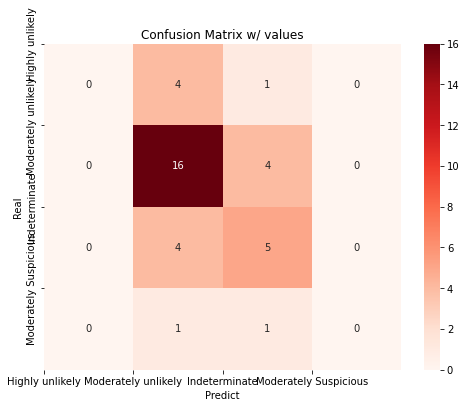

In [58]:
est = 21
time_stats_knn(est)
show_stats_knn(est)
build_cm_knn(X, y, est)
build_heatmap_knn(X, y, est)

## Lasso features with sd = 1.5

In [59]:
X = high_2d_sd[high_lasso]
y = high_2d_sd['Malignancy']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

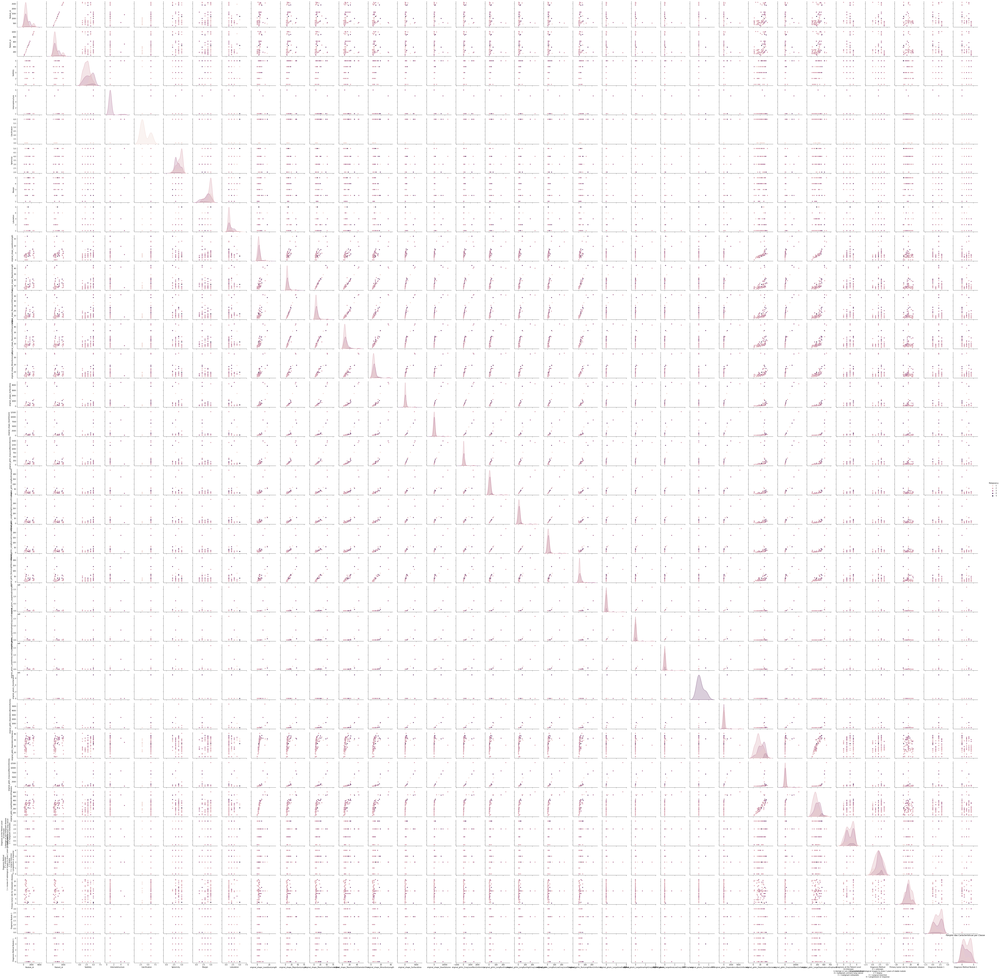

In [77]:
build_pairplot(high_2d_sd, X)

### With KNN

[0.2777777777777778, 0.25, 0.2777777777777778, 0.3611111111111111, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0.3888888888888889, 0.3888888888888889, 0.4166666666666667, 0.3611111111111111, 0.3611111111111111, 0.3888888888888889, 0.4166666666666667, 0.4166666666666667, 0.4444444444444444, 0.4444444444444444, 0.4444444444444444, 0.3888888888888889, 0.4722222222222222]
Best k = 20


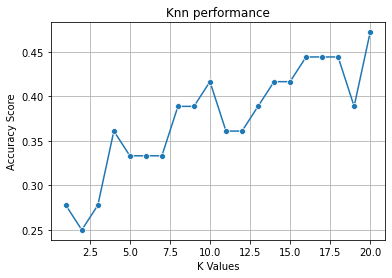

In [60]:
find_k_knn(X, y, 20)

Tempo de Treinamento 0.0055925846099853516 segundos
             Feature Set  Precision    Recall  F1-score
0        Highly unlikely   0.000000  0.000000  0.000000
1    Moderately unlikely   0.769231  0.500000  0.606061
2          Indeterminate   0.318182  0.777778  0.451613
3  Moderately Suspicious   0.000000  0.000000  0.000000
Confusion Matrix:
 [[ 0  1  4  0]
 [ 1 10  9  0]
 [ 0  2  7  0]
 [ 0  0  2  0]]


C:\Users\regda\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


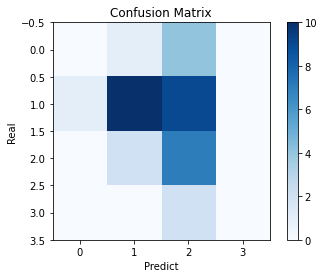

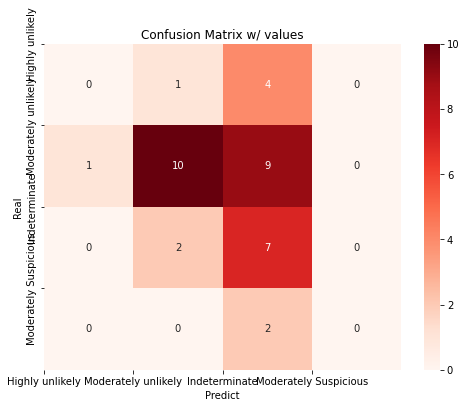

In [61]:
k = 20
time_stats_knn(k)
show_stats_knn(k)
build_cm_knn(X, y, k)
build_heatmap_knn(X, y, k)

### With RandomForest

[0.4166666666666667, 0.5277777777777778, 0.5833333333333334, 0.6388888888888888, 0.6388888888888888, 0.5833333333333334, 0.5555555555555556, 0.5277777777777778, 0.6388888888888888, 0.5555555555555556, 0.5277777777777778, 0.5833333333333334, 0.5555555555555556, 0.5833333333333334, 0.5833333333333334, 0.5833333333333334, 0.6111111111111112, 0.5555555555555556, 0.5833333333333334, 0.5833333333333334]
Best estimator = 31


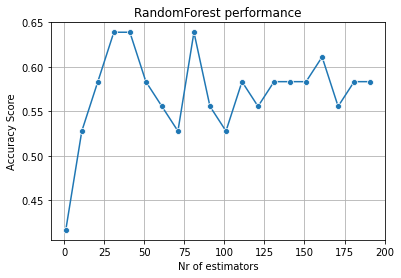

In [29]:
find_est_rf(X, y, 200, 42)

Tempo de Treinamento 0.006020069122314453 segundos
             Feature Set  Precision  Recall  F1-score
0        Highly unlikely   0.000000     0.0  0.000000
1    Moderately unlikely   0.555556     1.0  0.714286
2          Indeterminate   0.000000     0.0  0.000000
3  Moderately Suspicious   0.000000     0.0  0.000000
Confusion Matrix:
 [[ 0  5  0  0]
 [ 0 20  0  0]
 [ 0  9  0  0]
 [ 0  2  0  0]]


C:\Users\regda\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


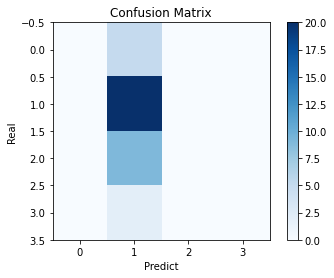

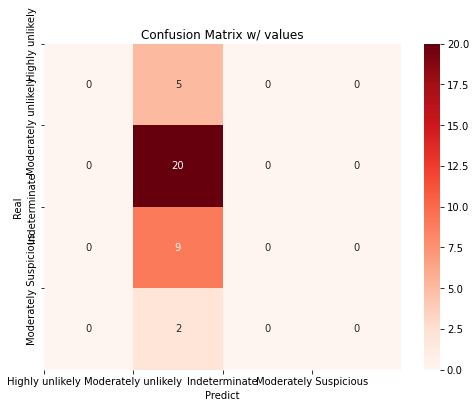

In [62]:
est = 71
time_stats_knn(est)
show_stats_knn(est)
build_cm_knn(X, y, est)
build_heatmap_knn(X, y, est)

# Conclusions

In [87]:
data = {'Feature Set': ['0.5 RFE KNN', '0.5 RFE RF', '1.0 Tree KNN', '1.0 Tree RF',  '1.5 Lasso KNN', '1.5 Lasso RF'],
        'Best k/est': [20, 81, 4, 21, 20, 71],
        'Accuracy': [0.47, 0.72, 0.66, 0.72, 0.47, 0.64],
        'Tempo': [0.0086, 0.0050, 0.0076, 0.0030, 0.0057, 0.0075] }

df = pd.DataFrame(data)
df

,Feature Set,Best k/est,Accuracy,Tempo
0,0.5 RFE KNN,20,0.47,0.0086
1,0.5 RFE RF,81,0.72,0.0050
2,1.0 Tree KNN,4,0.66,0.0076
3,1.0 Tree RF,21,0.72,0.0030
4,1.5 Lasso KNN,20,0.47,0.0057
5,1.5 Lasso RF,71,0.64,0.0075


As we can see, the RandomForest had a better performance on the 3 feature sets when compared to KNN.
We can also conclude that the feature selection "Tree" with sd = 1.0 and threshold = 0.2 had the best performance, since
it had a good accuracy in both of the methods used.

When talking about the confusion matrices and the heatmap itself, we are looking for a dense color on the diagonal y = -x.
The results weren't as good as we thought though.

The pairplots compare the influence and contribute the features used had on the training process.

Overall, we were expecting a little more from the KNN method, but the results given by the RandomForest were acceptable.